Necessary imports

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

Convolution with filters function

In [2]:
def conv(image, sep_kernel1, sep_kernel2):
    m, n = image.shape
    sep_kernel1 = np.array(sep_kernel1, dtype=np.float32)
    sep_kernel2 = np.array(sep_kernel2, dtype=np.float32)
    output = np.zeros_like(image, dtype=np.float32)

    # Pad the image with appropriate boundary conditions
    padded_image = np.pad(image, pad_width=1, mode='constant', constant_values=0)

    for i in range(1, m + 1):
        for j in range(1, n + 1):
            patch = padded_image[i-1:i+2, j-1:j+2]
            output[i-1, j-1] = np.sum(sep_kernel1 * np.sum(patch * sep_kernel2, axis=1))

    return output


Plotting the sample images

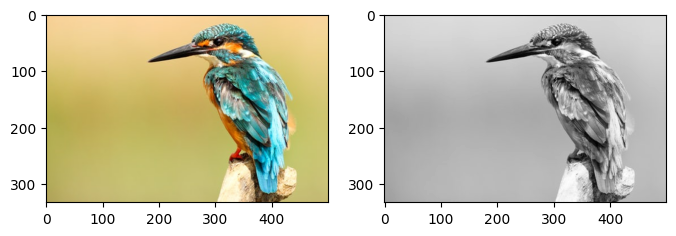

In [3]:
img = cv2.imread("./Question_1_photos/2.jpeg", cv2.IMREAD_COLOR)

# inp_dim_x = 1200
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# inp_dim_y = 100
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# gray_img = cv2.resize(gray_img, (inp_dim_x, inp_dim_y))/256
gray_img = gray_img/256
fig, axs = plt.subplots(1, 2, figsize=(8, 12))
axs[0].imshow(img)
axs[1].imshow(gray_img, cmap= "gray")

Checking the image response to gaussian filter

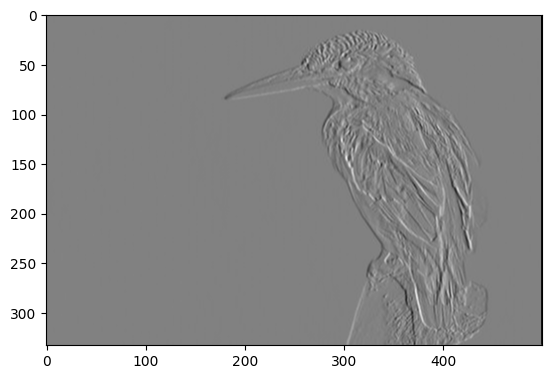

In [4]:
gaussian = conv(gray_img, [1,2,1],[-1,0,1])
plt.imshow(gaussian, cmap = "gray")

Checking response for the Sobel filters

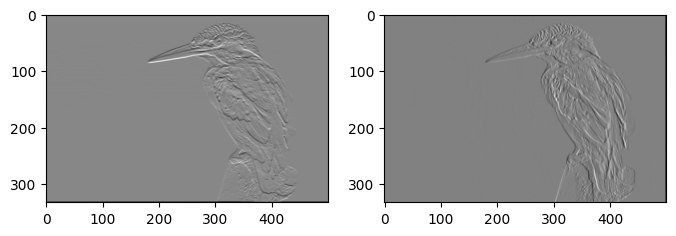

In [5]:
sobel_x = conv(gray_img, [-1,0,1], [1,2,1])
sobel_y = conv(gray_img, [1,2,1],[-1,0,1])
fig, axs = plt.subplots(1, 2, figsize = (8,12))
axs[0].imshow(sobel_x, cmap = "gray")
axs[1].imshow(sobel_y, cmap = "gray")
# plt.imshow(gaussian_img, cmap = "gray")

Function for computing corners

In [6]:
def compute_corner(pic, window_size = 3, k = 0.04):
    gray_img1 = cv2.cvtColor(pic, cv2.COLOR_RGB2GRAY)
    padded_image = np.pad(gray_img1, pad_width=1, constant_values=0)
    x = padded_image.shape[0]
    y = padded_image.shape[1]
    corner_image = np.zeros_like(padded_image, dtype=np.float32)

    for i in range(window_size, x - window_size-1):
        for j in range(window_size, y - window_size-1):
            patch = padded_image[i - window_size: i + window_size, j - window_size : j + window_size]
            Ix = conv(patch, [1,2,1], [-1,0,1])
            Iy = conv(patch, [-1,0,1], [1,2,1])

            Harris_matrix = np.zeros((2,2), dtype=np.float32)
            Harris_matrix[0][0] = np.sum(Ix @ Ix)
            Harris_matrix[0][1] = np.sum(Ix @ Iy)
            Harris_matrix[1][0] = np.sum(Iy @ Ix)
            Harris_matrix[1][1] = np.sum(Iy @ Iy)

            # print(Harris_matrix)
            # break
            R_val = np.linalg.det(Harris_matrix) - k*(np.trace(Harris_matrix))**2
            corner_image[i][j] = R_val
    
    corner_image = cv2.dilate(corner_image, None)
    thresh = 0.1*corner_image.max()

    # Create an image copy to draw corners on
    vis_image = np.copy(pic)

    # Iterate through all the corners and draw them on the image (if they pass the threshold)
    for j in range(0, vis_image.shape[0]):
        for i in range(0, vis_image.shape[1]):
            if(corner_image[j,i] > thresh):
                # image, center pt, radius, color, thickness
                cv2.circle( vis_image, (i, j), 1, (0,255,0), 1)
    return vis_image

Checking for the plots and corresponding corners

In [7]:
osdir_list = os.listdir("./Question_1_photos")
# print(osdir_list)
fig, axs = plt.subplots(2,5, figsize = (50,20))

for i in range(0,5):
    path = "./Question_1_photos/" + osdir_list[i]
    img1 = cv2.imread(path, cv2.IMREAD_COLOR)
    img1 = cv2.resize(img1, (400, 400))
    corner_image = compute_corner(img1)
    axs[0][i-1].imshow(img1)
    axs[1][i-1].imshow(corner_image)

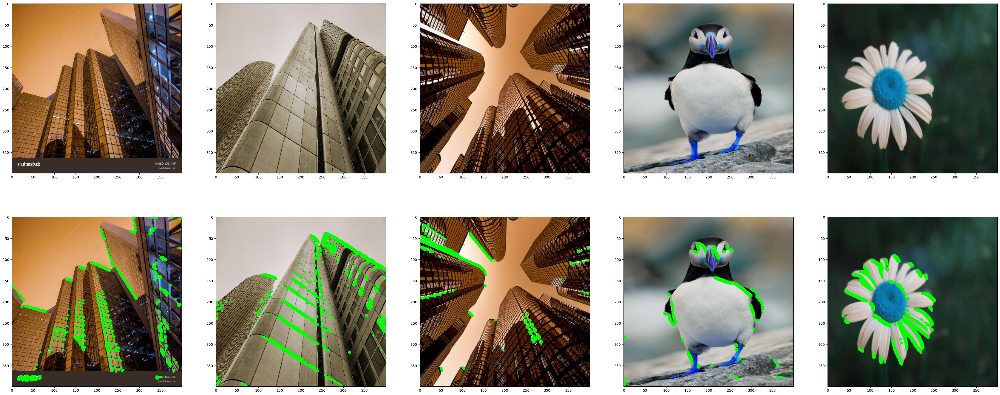

In [ ]:
fig, axs = plt.subplots(2,5, figsize = (50,20))

for i in range(5,10):
    path = "./Question_1_photos/" + osdir_list[i]
    img1 = cv2.imread(path, cv2.IMREAD_COLOR)
    img1 = cv2.resize(img1, (400, 400))
    corner_image = compute_corner(img1)
    # corner_image = img1.copy()
    axs[0][i-6].imshow(img1)
    axs[1][i-6].imshow(corner_image)
    # print("Done for ", i)

Inbuilt Function for Harris corner detection

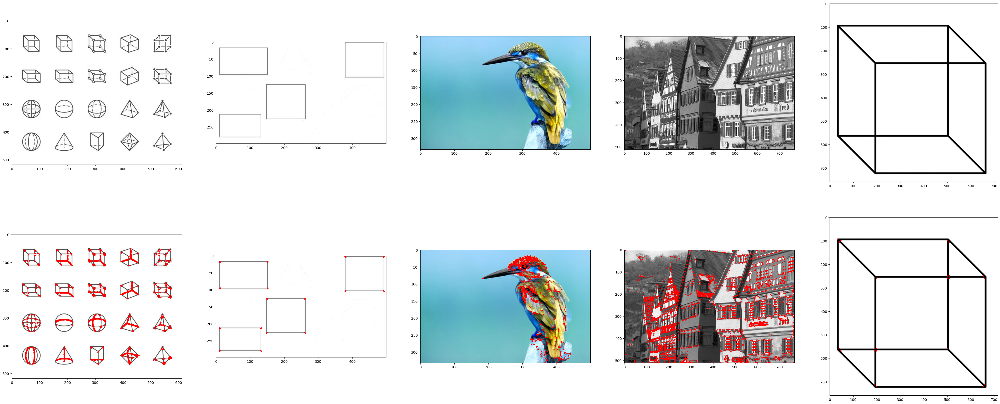

In [14]:
osdir_list = os.listdir("./Question_1_photos")
# print(osdir_list)
fig, axs = plt.subplots(2,5, figsize = (50,20))

for i in range(0,5):
    path = "./Question_1_photos/" + osdir_list[i]
    img_o = cv2.imread(path, cv2.IMREAD_COLOR)
    gray_img1 = cv2.cvtColor(img_o, cv2.COLOR_RGB2GRAY)
    # gray_img = cv2.resize(gray_img, (inp_dim_x, inp_dim_y))/256
    # gray_img1 = gray_img1/256
    block_size = 2  
    ksize = 3       
    k = 0.04        
    harris_response = cv2.cornerHarris(gray_img1, blockSize=block_size, ksize=ksize, k=k)
    threshold = 0.01 * harris_response.max()  
    corner_image = np.zeros_like(gray_img1)
    corner_image[harris_response > threshold] = 255 
    # corner_image = img1.copy()
    axs[0][i-1].imshow(img_o)
    axs[1][i-1].imshow(img_o)

    scatter_point_x = []
    scatter_point_y = []
    for k in range(len(corner_image)):
        for j in range(len(corner_image[0])):
            if(corner_image[k][j] == 255):
                # scatter_point.append([k,j])
                scatter_point_x.append(j)
                scatter_point_y.append(k)
        
    axs[1][i-1].scatter(scatter_point_x, scatter_point_y, s = 2, color ="red")

Inbuilt function for harris corner detection

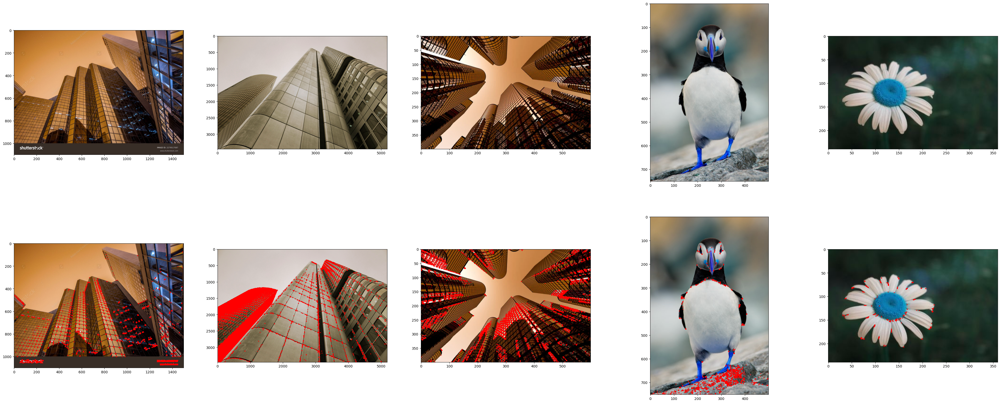

In [13]:
osdir_list = os.listdir("./Question_1_photos")
# print(osdir_list)
fig, axs = plt.subplots(2,5, figsize = (50,20))

for i in range(5,10):
    path = "./Question_1_photos/" + osdir_list[i]
    img_o = cv2.imread(path, cv2.IMREAD_COLOR)
    gray_img1 = cv2.cvtColor(img_o, cv2.COLOR_RGB2GRAY)
    # gray_img = cv2.resize(gray_img, (inp_dim_x, inp_dim_y))/256
    # gray_img1 = gray_img1/256
    block_size = 2  
    ksize = 3       
    k = 0.04        
    harris_response = cv2.cornerHarris(gray_img1, blockSize=block_size, ksize=ksize, k=k)
    threshold = 0.01 * harris_response.max()  
    corner_image = np.zeros_like(gray_img1)
    corner_image[harris_response > threshold] = 255 
    # corner_image = img1.copy()
    axs[0][i-6].imshow(img_o)
    axs[1][i-6].imshow(img_o)

    scatter_point_x = []
    scatter_point_y = []
    for k in range(len(corner_image)):
        for j in range(len(corner_image[0])):
            if(corner_image[k][j] == 255):
                # scatter_point.append([k,j])
                scatter_point_x.append(j)
                scatter_point_y.append(k)
        
    axs[1][i-6].scatter(scatter_point_x, scatter_point_y, s = 2, color ="red")